## **Problem Statement**
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.

In [1]:
import pandas as pd
import numpy as np

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_score,
    recall_score,
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report

# Others
import operator
import warnings

warnings.filterwarnings("ignore")

## **Data Preperation**

Load the dataset into dataframe

In [2]:
pd_train = pd.read_csv("train.csv")
pd_test = pd.read_csv("test.csv")

In [3]:
pd.options.display.max_columns = 4000
pd_train.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [4]:
pd.options.display.max_columns = 4000
pd_test.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [5]:
pd_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [6]:
pd_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Columns: 171 entries, id to jun_vbc_3g
dtypes: float64(135), int64(27), object(9)
memory usage: 39.1+ MB


In [7]:
pd.options.display.max_rows = 4000
display(pd_train.isna().sum())

id                              0
circle_id                       0
loc_og_t2o_mou                702
std_og_t2o_mou                702
loc_ic_t2o_mou                702
last_date_of_month_6            0
last_date_of_month_7          399
last_date_of_month_8          733
arpu_6                          0
arpu_7                          0
arpu_8                          0
onnet_mou_6                  2768
onnet_mou_7                  2687
onnet_mou_8                  3703
offnet_mou_6                 2768
offnet_mou_7                 2687
offnet_mou_8                 3703
roam_ic_mou_6                2768
roam_ic_mou_7                2687
roam_ic_mou_8                3703
roam_og_mou_6                2768
roam_og_mou_7                2687
roam_og_mou_8                3703
loc_og_t2t_mou_6             2768
loc_og_t2t_mou_7             2687
loc_og_t2t_mou_8             3703
loc_og_t2m_mou_6             2768
loc_og_t2m_mou_7             2687
loc_og_t2m_mou_8             3703
loc_og_t2f_mou

In [8]:
display(pd_test.isna().sum())

id                              0
circle_id                       0
loc_og_t2o_mou                316
std_og_t2o_mou                316
loc_ic_t2o_mou                316
last_date_of_month_6            0
last_date_of_month_7          202
last_date_of_month_8          367
arpu_6                          0
arpu_7                          0
arpu_8                          0
onnet_mou_6                  1169
onnet_mou_7                  1172
onnet_mou_8                  1675
offnet_mou_6                 1169
offnet_mou_7                 1172
offnet_mou_8                 1675
roam_ic_mou_6                1169
roam_ic_mou_7                1172
roam_ic_mou_8                1675
roam_og_mou_6                1169
roam_og_mou_7                1172
roam_og_mou_8                1675
loc_og_t2t_mou_6             1169
loc_og_t2t_mou_7             1172
loc_og_t2t_mou_8             1675
loc_og_t2m_mou_6             1169
loc_og_t2m_mou_7             1172
loc_og_t2m_mou_8             1675
loc_og_t2f_mou

## **Data Cleaning**

Drop the feature which above 40% of NULL value

In [9]:
List_na_drop = [
    "date_of_last_rech_data_6",
    "date_of_last_rech_data_7",
    "date_of_last_rech_data_8",
    "total_rech_data_6",
    "total_rech_data_7",
    "total_rech_data_8",
    "max_rech_data_6",
    "max_rech_data_7",
    "max_rech_data_8",
    "count_rech_2g_6",
    "count_rech_2g_7",
    "count_rech_2g_8",
    "count_rech_3g_6",
    "count_rech_3g_7",
    "count_rech_3g_8",
    "av_rech_amt_data_6",
    "av_rech_amt_data_7",
    "av_rech_amt_data_8",
    "fb_user_6",
    "fb_user_7",
    "fb_user_8",
    "arpu_3g_6",
    "arpu_3g_7",
    "arpu_3g_8",
    "arpu_2g_6",
    "arpu_2g_7",
    "arpu_2g_8",
    "night_pck_user_6",
    "night_pck_user_7",
    "night_pck_user_8",
]

In [10]:
pd_train = pd_train.drop(List_na_drop, axis=1)
pd_test = pd_test.drop(List_na_drop, axis=1)

In [11]:
pd_train.shape, pd_test.shape

((69999, 142), (30000, 141))

In [12]:
display(pd_train.isna().sum())

id                         0
circle_id                  0
loc_og_t2o_mou           702
std_og_t2o_mou           702
loc_ic_t2o_mou           702
last_date_of_month_6       0
last_date_of_month_7     399
last_date_of_month_8     733
arpu_6                     0
arpu_7                     0
arpu_8                     0
onnet_mou_6             2768
onnet_mou_7             2687
onnet_mou_8             3703
offnet_mou_6            2768
offnet_mou_7            2687
offnet_mou_8            3703
roam_ic_mou_6           2768
roam_ic_mou_7           2687
roam_ic_mou_8           3703
roam_og_mou_6           2768
roam_og_mou_7           2687
roam_og_mou_8           3703
loc_og_t2t_mou_6        2768
loc_og_t2t_mou_7        2687
loc_og_t2t_mou_8        3703
loc_og_t2m_mou_6        2768
loc_og_t2m_mou_7        2687
loc_og_t2m_mou_8        3703
loc_og_t2f_mou_6        2768
loc_og_t2f_mou_7        2687
loc_og_t2f_mou_8        3703
loc_og_t2c_mou_6        2768
loc_og_t2c_mou_7        2687
loc_og_t2c_mou

In [13]:
pd.options.display.max_rows = 4000
display(pd_train.info(verbose=1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 142 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    circle_id             int64  
 2    loc_og_t2o_mou        float64
 3    std_og_t2o_mou        float64
 4    loc_ic_t2o_mou        float64
 5    last_date_of_month_6  object 
 6    last_date_of_month_7  object 
 7    last_date_of_month_8  object 
 8    arpu_6                float64
 9    arpu_7                float64
 10   arpu_8                float64
 11   onnet_mou_6           float64
 12   onnet_mou_7           float64
 13   onnet_mou_8           float64
 14   offnet_mou_6          float64
 15   offnet_mou_7          float64
 16   offnet_mou_8          float64
 17   roam_ic_mou_6         float64
 18   roam_ic_mou_7         float64
 19   roam_ic_mou_8         float64
 20   roam_og_mou_6         float64
 21   roam_og_mou_7         float64
 22   roam_og_mou_8       

None

Drop the date columns

In [14]:
List_dates = [
    "last_date_of_month_6",
    "last_date_of_month_7",
    "last_date_of_month_8",
    "date_of_last_rech_6",
    "date_of_last_rech_7",
    "date_of_last_rech_8",
]
pd_train = pd_train.drop(List_dates, axis=1)
pd_test = pd_test.drop(List_dates, axis=1)

In [15]:
pd_train.shape, pd_test.shape

((69999, 136), (30000, 135))

Remove ID columns  

In [16]:
pd_train = pd_train.drop(["id", "circle_id"], axis=1)
pd_test = pd_test.drop(["id", "circle_id"], axis=1)
pd_train.shape, pd_test.shape

((69999, 134), (30000, 133))

In [17]:
pd_train.isnull().mean() > 0

loc_og_t2o_mou         True
std_og_t2o_mou         True
loc_ic_t2o_mou         True
arpu_6                False
arpu_7                False
arpu_8                False
onnet_mou_6            True
onnet_mou_7            True
onnet_mou_8            True
offnet_mou_6           True
offnet_mou_7           True
offnet_mou_8           True
roam_ic_mou_6          True
roam_ic_mou_7          True
roam_ic_mou_8          True
roam_og_mou_6          True
roam_og_mou_7          True
roam_og_mou_8          True
loc_og_t2t_mou_6       True
loc_og_t2t_mou_7       True
loc_og_t2t_mou_8       True
loc_og_t2m_mou_6       True
loc_og_t2m_mou_7       True
loc_og_t2m_mou_8       True
loc_og_t2f_mou_6       True
loc_og_t2f_mou_7       True
loc_og_t2f_mou_8       True
loc_og_t2c_mou_6       True
loc_og_t2c_mou_7       True
loc_og_t2c_mou_8       True
loc_og_mou_6           True
loc_og_mou_7           True
loc_og_mou_8           True
std_og_t2t_mou_6       True
std_og_t2t_mou_7       True
std_og_t2t_mou_8    

In [18]:
list_train_columns = pd_test.columns.values
for list_column in list_train_columns:
    mean_value = pd_train[list_column].mean()
    if mean_value < 1:
        pd_train = pd_train.drop([list_column], axis=1)
        pd_test = pd_test.drop([list_column], axis=1)
    else:
        pd_train[list_column].fillna(value=mean_value, inplace=True)
        pd_test[list_column].fillna(value=mean_value, inplace=True)

pd_train.shape, pd_test.shape

((69999, 102), (30000, 101))

In [19]:
pd_train.isna().sum(), pd_test.isna().sum()

(arpu_6                0
 arpu_7                0
 arpu_8                0
 onnet_mou_6           0
 onnet_mou_7           0
 onnet_mou_8           0
 offnet_mou_6          0
 offnet_mou_7          0
 offnet_mou_8          0
 roam_ic_mou_6         0
 roam_ic_mou_7         0
 roam_ic_mou_8         0
 roam_og_mou_6         0
 roam_og_mou_7         0
 roam_og_mou_8         0
 loc_og_t2t_mou_6      0
 loc_og_t2t_mou_7      0
 loc_og_t2t_mou_8      0
 loc_og_t2m_mou_6      0
 loc_og_t2m_mou_7      0
 loc_og_t2m_mou_8      0
 loc_og_t2f_mou_6      0
 loc_og_t2f_mou_7      0
 loc_og_t2f_mou_8      0
 loc_og_t2c_mou_6      0
 loc_og_t2c_mou_7      0
 loc_og_t2c_mou_8      0
 loc_og_mou_6          0
 loc_og_mou_7          0
 loc_og_mou_8          0
 std_og_t2t_mou_6      0
 std_og_t2t_mou_7      0
 std_og_t2t_mou_8      0
 std_og_t2m_mou_6      0
 std_og_t2m_mou_7      0
 std_og_t2m_mou_8      0
 std_og_t2f_mou_6      0
 std_og_t2f_mou_7      0
 std_og_t2f_mou_8      0
 std_og_mou_6          0


In [20]:
pd_train.describe(include="all")

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_7,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,283.134365,278.185912,278.858826,133.153275,133.894438,132.978257,198.874771,197.153383,196.543577,9.765435,7.014568,7.004892,14.186457,9.842191,9.771783,46.904854,46.166503,45.686109,93.238231,90.799240,91.121447,3.743179,3.777031,3.661652,1.126025,1.361052,1.420840,143.893585,140.750120,140.476486,80.619382,83.775851,83.471486,88.152110,91.538615,90.586999,1.126377,1.084062,1.057739,169.900601,176.401217,175.118852,3.958619,4.976783,5.045027,306.451436,310.572674,304.513065,48.043255,47.882736,47.256388,107.152439,106.489856,108.154731,12.050672,12.563665,11.716763,167.255126,166.945103,167.136761,9.476958,9.873468,9.910217,20.734858,21.685359,21.089042,2.146273,2.199395,2.075179,32.360632,33.760809,33.077030,199.710640,201.878029,198.486034,7.394167,8.171162,8.348424,1.019680,7.566522,7.706667,7.224932,328.139788,322.376363,323.846355,104.569265,104.137573,107.540351,63.426949,59.294218,62.489478,51.773924,51.240204,50.127506,122.171882,128.934444,135.486541,1220.639709,68.108597,65.935830,60.07674,0.101887
std,334.213918,344.366927,351.924315,293.972404,305.244261,303.534603,310.491042,316.232126,315.400354,56.228580,54.876393,51.9

In [21]:
pd_train.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 102 columns):
 #    Column              Dtype  
---   ------              -----  
 0    arpu_6              float64
 1    arpu_7              float64
 2    arpu_8              float64
 3    onnet_mou_6         float64
 4    onnet_mou_7         float64
 5    onnet_mou_8         float64
 6    offnet_mou_6        float64
 7    offnet_mou_7        float64
 8    offnet_mou_8        float64
 9    roam_ic_mou_6       float64
 10   roam_ic_mou_7       float64
 11   roam_ic_mou_8       float64
 12   roam_og_mou_6       float64
 13   roam_og_mou_7       float64
 14   roam_og_mou_8       float64
 15   loc_og_t2t_mou_6    float64
 16   loc_og_t2t_mou_7    float64
 17   loc_og_t2t_mou_8    float64
 18   loc_og_t2m_mou_6    float64
 19   loc_og_t2m_mou_7    float64
 20   loc_og_t2m_mou_8    float64
 21   loc_og_t2f_mou_6    float64
 22   loc_og_t2f_mou_7    float64
 23   loc_og_t2f_mou_8    float64
 24   

**Handling Outliers**

In [22]:
list_train_columns = pd_test.columns.values
for list_column in list_train_columns:
    second_layer = pd_train[list_column].quantile(0.99)
    pd_train = pd_train[pd_train[list_column] < second_layer]
    pd_train = pd_train[pd_train[list_column] >= 0]
pd_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_7,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.0,0.0,65.09,204.99,1.01,8.20,0.63,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.00,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.0,0.69,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.00,0.00,0.0,0.0,0.0,1958,0.0,0.0,0.0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.00,0.00,0.0,0.0,28.94,84.99,0.00,2.89,1.38,0.00,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.00,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.0,0.00,2,4,2,70,120,0,70,70,0,70,50,0,0.0,0.00,0.00,0.0,0.0,0.0,882,0.0,0.0,0.0,0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.60,0.56,0.0,0.0,16.16,37.99,4.60,14.95,9.13,25.61,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.00,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.0,0.00,2,4,3,160,240,130,110,110,50,110,110,50,0.0,0.00,0.00,0.0,0.0,0.0,982,0.0,0.0,0.0,0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,6.13,36.74,19.88,4.61,11.99,1.23,5.01,0.00,9.85,0.00,58.91,25.94,15.76,0.00,0.00,0.00,4.35,0.00,0.00,0.00,0.0,0.0,4.35,0.00,0.00,0.00,17.00,0.00,63.26,42.94,15.76,5.44,1.39,2.66,10.58,4.33,19.49,5.51,3.63,6.14,21.54,9.36,28.31,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,21.54,9.36,28.31,0.0,0.0,0.0,0.00,13,10,8,290,136,122,50,41,30,25,10,30,390.8,308.89,213.47,0.0,0.0,0.0,647,0.0,0.0,0.0,0
6,54.173,95.130,6.386,38.81,40.56,19.61,31.63,54.18,5.69,0.00,0.0,0.0,0.00,0.0,0.00,38.81,24.51,19.61,31.63,54.18,5.58,0.00,0.00,0.00,0.00,0.00,0.00,70.44,78.69,25.19,0.00,16.05,0.00,0.00,0.00,0.11,0.00,0.0,0.0,0.00,16.05,0.11,0.00,0.00,0.00,70.44,94.74,25.31,94.09,54.59,86.83,7.38,0.81,31.53,0.16,3.36,3.46,101.64,58.78,121.83,3.58,4.34,2.95,0.91,1.16,9.78,0.0,0.18,0.0,4.49,5.69,12.73,106.14,64.48,134.56,0.0,0.0,0.0,0.00,3,2,3,130,0,130,110,0,130,110,0,130,0.0,0.00,0.00,0.0,0

<Axes: >

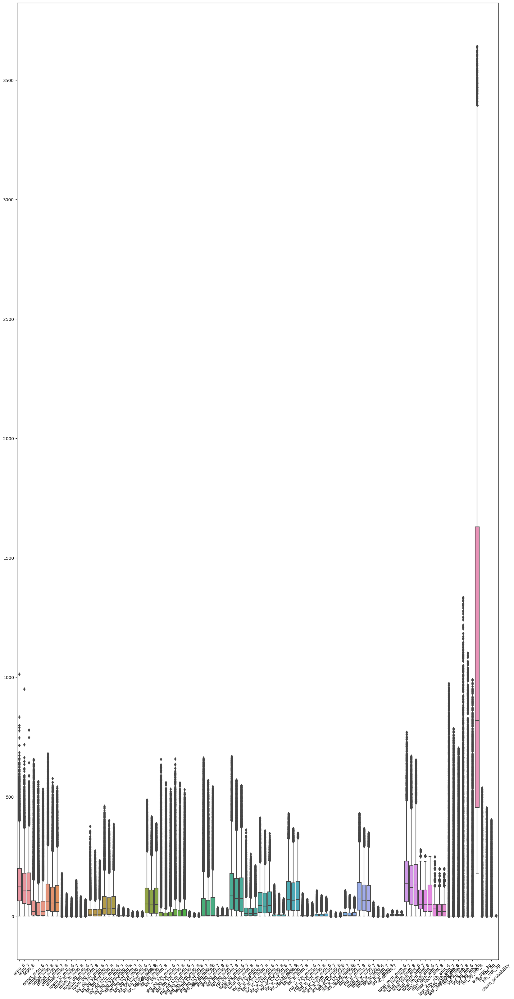

In [23]:
plt.figure(figsize=(20, 40))
plt.xticks(rotation=45)
sns.boxplot(data=pd_train)

(24223, 102)


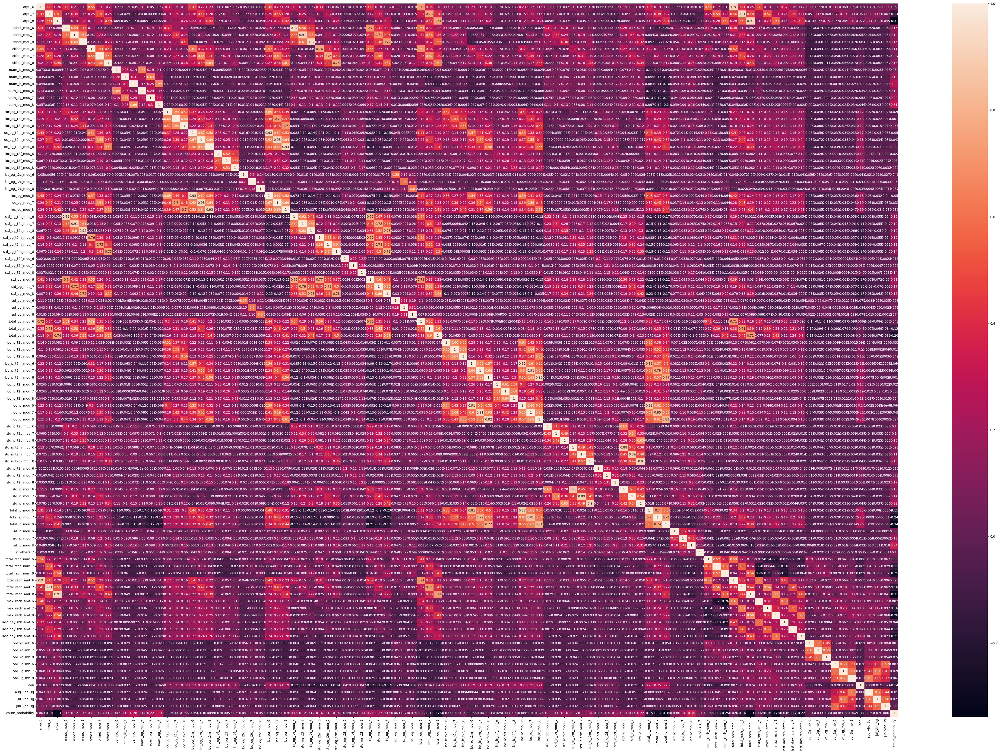

In [24]:
corr = pd_train.corr()
print(pd_train.shape)
plt.figure(figsize=(60, 40))
sns.heatmap(corr, annot=True)
plt.show()

## **Scaling of the features**

In [25]:
# Spliting x_train and y_train
y_train = pd_train["churn_probability"]
X_train = pd_train.drop(["churn_probability"], axis=1)
y_train.head, X_train.head()

(<bound method NDFrame.head of 0        0
 2        0
 3        0
 4        0
 6        0
         ..
 69986    0
 69989    0
 69991    0
 69992    0
 69994    0
 Name: churn_probability, Length: 24223, dtype: int64>,
     arpu_6   arpu_7   arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
 0   31.277   87.009    7.527        48.58       124.38         1.29   
 2   60.806  103.176    0.000         0.53        15.93         0.00   
 3  156.362  205.260  111.095         7.26        16.01         0.00   
 4  240.708  128.191  101.565        21.28         4.83         6.13   
 6   54.173   95.130    6.386        38.81        40.56        19.61   
 
    offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  roam_ic_mou_7  \
 0         32.24         96.68          2.33           0.00            0.0   
 2         53.99         82.05          0.00           0.00            0.0   
 3         68.76         78.48         50.23           0.00            0.0   
 4         56.99         38.11      

In [26]:
scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(pd_test)

In [27]:
X_train = pd.DataFrame(data=X_train, columns=pd_test.columns.values)
X_test = pd.DataFrame(data=X_test, columns=pd_test.columns.values)
print(X_train.head())
print(X_test.head())

     arpu_6    arpu_7    arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
0 -1.039770 -0.386453 -1.187120    -0.045999     1.104942    -0.655298   
1 -0.763242 -0.220293 -1.263872    -0.635808    -0.430878    -0.673262   
2  0.131607  0.828898 -0.131059    -0.553198    -0.429745    -0.673262   
3  0.921477  0.036804 -0.228235    -0.381104    -0.588072    -0.587896   
4 -0.825357 -0.302988 -1.198755    -0.165925    -0.082079    -0.400173   

   offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  roam_ic_mou_7  \
0     -0.635815      0.159445     -0.964277      -0.257689      -0.265147   
1     -0.408518     -0.011428     -0.991284      -0.257689      -0.265147   
2     -0.254165     -0.053124     -0.409064      -0.257689      -0.265147   
3     -0.377166     -0.524631     -0.879662       4.371249      -0.265147   
4     -0.642189     -0.336940     -0.925331      -0.257689      -0.265147   

   roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  \
0      -0.285547      -0.30

## **Feature Selection using RFE**

In [28]:
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(estimator=lm, n_features_to_select=50)
rfe = rfe.fit(X_train, y_train)

In [29]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 23),
 ('arpu_7', False, 26),
 ('arpu_8', False, 22),
 ('onnet_mou_6', False, 4),
 ('onnet_mou_7', False, 15),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_6', False, 5),
 ('offnet_mou_7', False, 3),
 ('offnet_mou_8', False, 2),
 ('roam_ic_mou_6', False, 49),
 ('roam_ic_mou_7', False, 25),
 ('roam_ic_mou_8', False, 20),
 ('roam_og_mou_6', False, 19),
 ('roam_og_mou_7', False, 14),
 ('roam_og_mou_8', False, 12),
 ('loc_og_t2t_mou_6', True, 1),
 ('loc_og_t2t_mou_7', True, 1),
 ('loc_og_t2t_mou_8', True, 1),
 ('loc_og_t2m_mou_6', True, 1),
 ('loc_og_t2m_mou_7', True, 1),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', True, 1),
 ('loc_og_t2f_mou_7', True, 1),
 ('loc_og_t2f_mou_8', True, 1),
 ('loc_og_t2c_mou_6', False, 46),
 ('loc_og_t2c_mou_7', False, 52),
 ('loc_og_t2c_mou_8', False, 39),
 ('loc_og_mou_6', True, 1),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2t_mou_6', True, 1),
 ('std_og_t2t_mou_7', True, 1),
 ('std_og_t2t_mou_8', True, 1),
 

In [30]:
ranked_features = X_train.columns[rfe.support_]
ranked_features

Index(['onnet_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8',
       'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_6',
       'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6',
       'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6',
       'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8'

# **Applying PCA**
Applying PCA on the training dataset to select the features and dimensional reduction

In [31]:
pca = PCA(random_state=42)

In [32]:
pca.fit(X_train[ranked_features])

PCA(random_state=42)

In [33]:
pca.components_

array([[ 8.21493400e-03,  1.76064937e-01,  1.88387051e-01, ...,
        -8.29828549e-03,  2.64245383e-03,  3.77023386e-03],
       [ 2.47310653e-01,  3.23648065e-02,  5.53652519e-02, ...,
         2.07628583e-01,  2.45408233e-01,  2.52133948e-01],
       [-2.86544196e-01, -1.24312430e-01, -1.47931605e-01, ...,
         2.83784385e-01,  2.61939839e-01,  1.89022392e-01],
       ...,
       [-1.79642683e-05,  2.27873818e-03,  2.98956242e-03, ...,
        -1.70603299e-02, -1.57770922e-02, -1.48672631e-02],
       [-5.41954485e-06,  6.20596279e-04, -1.38762295e-03, ...,
        -2.73779962e-04,  3.37611042e-03, -6.64243612e-03],
       [-2.92380388e-06,  5.90409140e-03, -1.73091086e-03, ...,
        -9.13624084e-03, -9.20711338e-04,  3.51740235e-04]])

In [34]:
pca.explained_variance_ratio_

array([1.88896328e-01, 1.42090512e-01, 6.51688247e-02, 4.98324909e-02,
       4.90285868e-02, 4.52145931e-02, 4.28948014e-02, 4.02034845e-02,
       3.42324523e-02, 3.12386816e-02, 2.61487700e-02, 2.41433348e-02,
       2.21368175e-02, 2.08886026e-02, 1.90780727e-02, 1.52847494e-02,
       1.48282173e-02, 1.46364528e-02, 1.37554772e-02, 1.28493135e-02,
       1.23144390e-02, 1.17677223e-02, 1.06395021e-02, 1.01800951e-02,
       9.36486133e-03, 8.90164115e-03, 8.43911443e-03, 8.21026234e-03,
       7.66276900e-03, 6.98362092e-03, 6.49519851e-03, 5.49446484e-03,
       5.15061178e-03, 4.80968774e-03, 4.28045247e-03, 3.73046947e-03,
       2.99840870e-03, 2.61137691e-05, 5.03605138e-10, 3.90242358e-10,
       3.50211008e-10, 9.68578822e-11, 5.86092362e-11, 5.50588195e-11,
       5.06738508e-11, 4.90793087e-11, 4.45475910e-11, 1.29154994e-11,
       9.05321126e-12, 8.20852006e-12])

<BarContainer object of 50 artists>

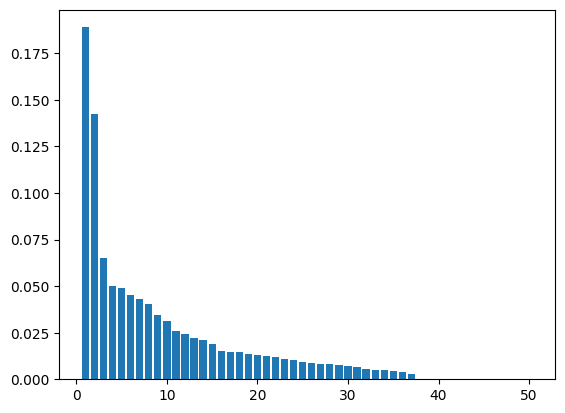

In [35]:
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)

In [36]:
var_cum = np.cumsum(pca.explained_variance_ratio_)

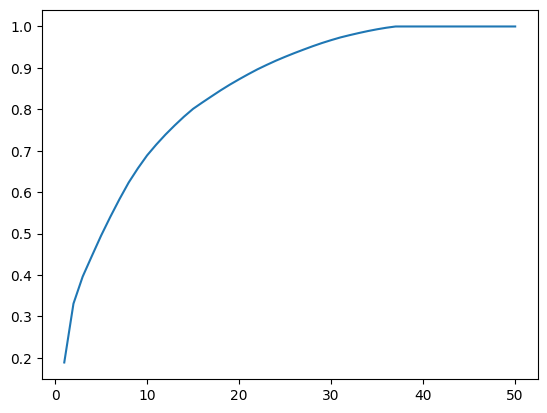

In [37]:
# Scree plot
plt.plot(range(1, len(var_cum) + 1), var_cum)

Based Scree Plot, we will take 30 features from PCA.

In [38]:
# PCA with 30 components_
pc2 = PCA(n_components=30, random_state=42)

In [39]:
X_train_PCA = pc2.fit_transform(X_train[ranked_features])
X_test_PCA = pc2.transform(X_test[ranked_features])

In [40]:
X_train_PCA.shape, X_test_PCA.shape

((24223, 30), (30000, 30))

In [41]:
pc_columns = ["PC" + str(i) for i in range(1, 31)]
X_train_PCA = pd.DataFrame(data=X_train_PCA, columns=pc_columns)
X_test_PCA = pd.DataFrame(data=X_test_PCA, columns=pc_columns)

In [42]:
X_train_PCA.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,-3.615455,0.464536,1.021297,0.403045,0.210807,-0.393060,-0.225101,-0.007852,-1.839833,-0.215441,0.102890,0.009557,-0.771849,-0.061003,-0.914784,0.748609,0.143187,0.826210,0.614593,0.107994,-0.609008,0.752745,-1.000334,0.313233,0.219966,0.088984,0.398023,0.389439,0.140594,0.052714
1,-2.612345,-1.063434,1.395073,1.019370,0.871090,0.330256,0.032319,0.179499,0.483802,-0.139668,-0.158705,0.137098,0.031661,0.092326,0.627890,-0.669552,-0.542730,-0.096029,-0.541266,0.228287,-0.189280,0.495549,-1.053363,0.105071,0.326135,0.775385,-0.100265,0.395786,-0.137716,-0.426291
2,-1.284578,-1.901449,0.239064,0.300709,0.432869,0.311854,-0.452572,-0.036568,0.209147,0.136707,-0.121165,-0.166883,-0.122058,0.273064,0.150567,0.177246,0.132935,0.081969,-0.170946,0.243909,-0.002787,-0.111650,-0.560277,0.202793,0.248879,0.003720,0.113785,0.248780,-0.123380,0.529748
3,-2.004443,-2.716019,0.118423,-1.110168,-0.388819,-0.367257,1.703845,-0.062639,0.152312,-1.315127,-0.829225,-0.332558,0.160140,-0.574556,-0.327706,-0.002743,-0.019148,0.150604,0.354197,0.130977,-0.020618,0.044321,-0.279122,1.099436,-0.294311,0.136993,0.520997,-1.248508,0.014350,-0.321960
4,0.103930,-1.208471,-0.275139,2.695080,-1.818397,-0.307490,-0.169333,-0.788920,0.028148,-0.295161,-0.306190,0.076633,0.514798,0.157923,-0.488527,0.474656,1.513850,0.031813,-0.255174,0.149768,0.223953,0.125732,-0.566242,0.051205,-0.559387,0.102541,0.263606,0.352284,0.108629,0.413859


<Axes: >

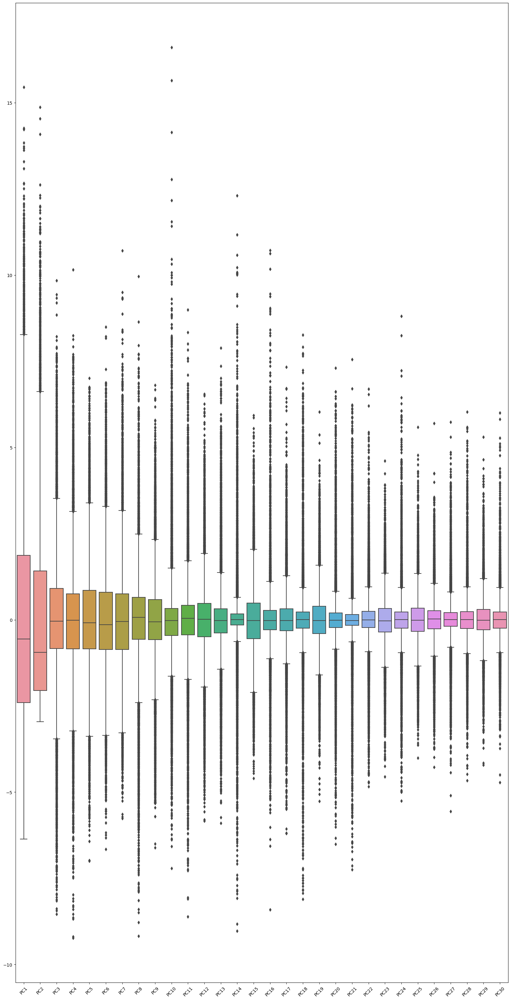

In [43]:
plt.figure(figsize=(20, 40))
plt.xticks(rotation=45)
sns.boxplot(data=X_train_PCA)

In [44]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k * array.std()
    lower_limit = array.mean() - k * array.std()
    array[array < lower_limit] = lower_limit
    array[array > upper_limit] = upper_limit
    return array

<Axes: >

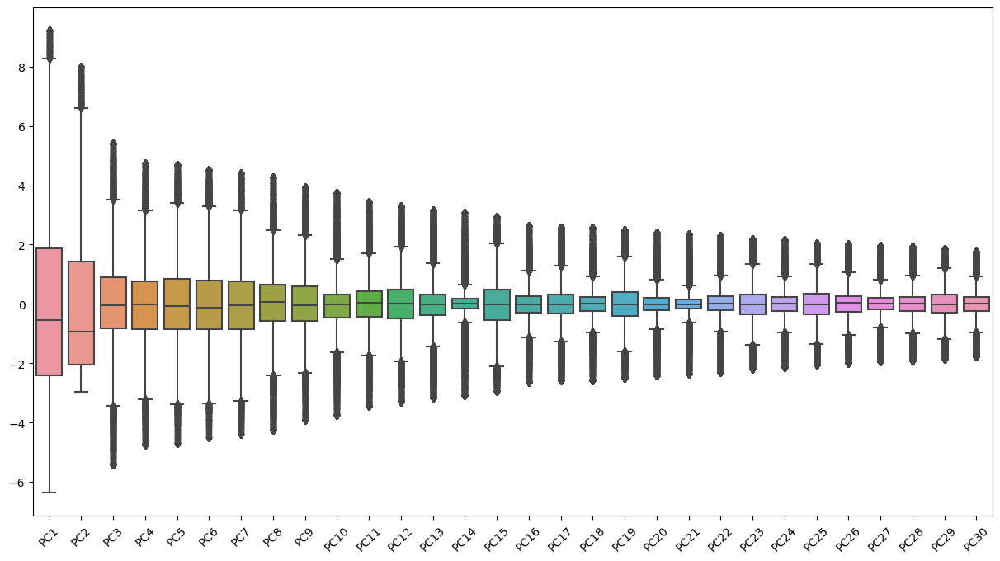

In [45]:
X_train_PCA = X_train_PCA.apply(cap_outliers, axis=0)

plt.figure(figsize=(15, 8))
plt.xticks(rotation=45)
sns.boxplot(data=X_train_PCA)

In [46]:
X_train_PCA.shape, y_train.shape

((24223, 30), (24223,))

In [47]:
X_test_PCA.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,-1.545609,-1.739007,-0.505479,0.387639,-0.601287,-0.688923,1.302029,-0.989746,-0.492354,-0.976502,-1.162858,-0.069359,0.033315,-0.579489,-0.121758,0.035609,0.055369,-0.394564,-0.663715,-0.179978,0.096259,-0.216542,0.687804,-0.574614,-0.531254,-0.280729,-0.785341,2.473415,0.137135,0.507033
1,11.990872,0.351162,-4.431618,-1.798319,8.941495,-3.516206,-0.121366,4.650288,-1.631787,-0.054153,3.206662,0.406771,0.247507,0.431902,-1.216268,0.853211,3.887089,0.667022,-1.307007,0.907552,0.334511,-0.426618,-0.297012,-0.168322,-1.047014,0.006561,-0.494812,-0.689208,-0.082062,1.498581
2,-3.728077,-2.929986,-0.109156,0.061326,-0.328233,-0.466621,0.147256,0.077507,-0.211976,-0.002922,0.190360,-0.010122,-0.036730,-0.016971,-0.049900,-0.029089,-0.033657,0.018155,-0.035811,-0.005469,-0.020591,-0.026783,-0.070271,0.008501,-0.013872,0.054038,0.012394,0.012461,-0.017235,0.003556
3,8.269150,0.278450,3.769701,0.054640,1.774224,6.532122,-8.560305,0.105812,-0.968262,1.458942,-5.296292,-0.265517,-0.354262,-0.027764,0.429344,-0.550337,-4.226733,-0.340784,0.588089,-0.821619,-0.864416,0.430283,-0.189818,-0.250668,0.512439,-0.051274,0.253544,-0.351098,0.715774,0.699280
4,-6.593217,24.145958,-3.394363,-0.877883,-8.397154,1.919245,-1.117878,12.304818,-2.622568,-1.925297,0.587184,-1.108853,7.725650,0.371125,-3.816649,1.329490,0.093086,-0.568711,0.851548,-0.222695,-1.660191,-6.310201,-0.198950,-0.356144,2.026263,-2.960374,0.432768,0.016426,0.072962,-0.439819


Test Train Split from training data

In [48]:
X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(
    X_train_PCA, y_train, test_size=0.3
)

X_train_data.shape, X_test_data.shape, y_train_data.shape, y_test_data.shape

((16956, 30), (7267, 30), (16956,), (7267,))

## **Model Building and evaulation**

## **Logisitic Regression**

Logisitic Regression Best parameter after CV is {'C': 100, 'penalty': 'l2'}

In [49]:
best_lr_model = LogisticRegression(C=100, random_state=42, penalty="l2")
best_lr_model.fit(X_train_PCA, y_train)

LogisticRegression(C=100, random_state=42)

In [50]:
y_train_pred_lg = best_lr_model.predict(X_train_data)
y_test_pred_lg = best_lr_model.predict(X_test_data)

In [51]:
y_train_pred_prob_lg = best_lr_model.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_lg = best_lr_model.predict_proba(X_test_data)[:, 1]

In [52]:
def Resultant(classifier, dataset, y_train, y_predict, y_predict_prob):
    print("Classifer on the dataset:", dataset, classifier)
    print(classification_report(y_train, y_predict))
    print("Confusion Matrix")
    print(confusion_matrix(y_train, y_predict))
    if dataset not in "Training":
        from sklearn.metrics import roc_auc_score
        from sklearn.metrics import roc_curve

        logit_roc_auc = roc_auc_score(y_train, y_predict)
        fpr, tpr, thresholds = roc_curve(y_train, y_predict_prob)
        plt.figure()
        plt.plot(fpr, tpr, label=classifier + "(area = %0.2f)" % logit_roc_auc)
        plt.plot([0, 1], [0, 1], "r--")
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Receiver operating characteristic")
        plt.legend(loc="lower right")
        plt.show()

In [53]:
Resultant(
    "LogisticRegression",
    "Training",
    y_train_data,
    y_train_pred_lg,
    y_train_pred_prob_lg,
)

Classifer on the dataset: Training LogisticRegression
              precision    recall  f1-score   support

           0       0.91      0.98      0.95     14938
           1       0.68      0.33      0.44      2018

    accuracy                           0.90     16956
   macro avg       0.80      0.65      0.69     16956
weighted avg       0.89      0.90      0.89     16956

Confusion Matrix
[[14633   305]
 [ 1360   658]]


Classifer on the dataset: Test LogisticRegression
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6369
           1       0.68      0.33      0.44       898

    accuracy                           0.90      7267
   macro avg       0.79      0.65      0.69      7267
weighted avg       0.88      0.90      0.88      7267

Confusion Matrix
[[6229  140]
 [ 604  294]]


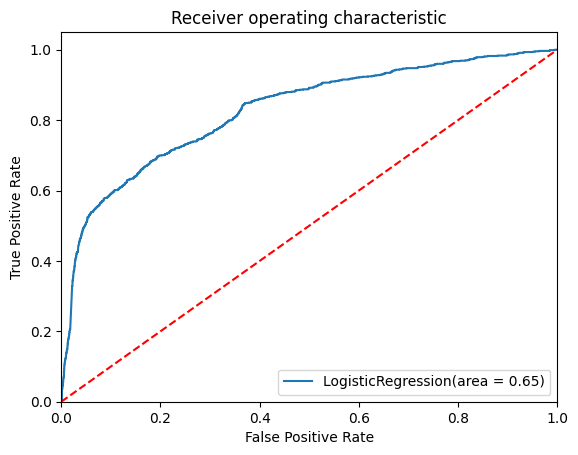

In [54]:
Resultant(
    "LogisticRegression", "Test", y_test_data, y_test_pred_lg, y_test_pred_prob_lg
)

# **Descision Tree Classifier**

Using Descision Tree Classifier with CV grid search to get the best model. The best parameters are {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 50}

In [55]:
dt_best_model = DecisionTreeClassifier(
    min_samples_leaf=50, random_state=42, criterion="entropy", max_depth=10
)
dt_best_model.fit(X_train_data, y_train_data)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=50,
                       random_state=42)

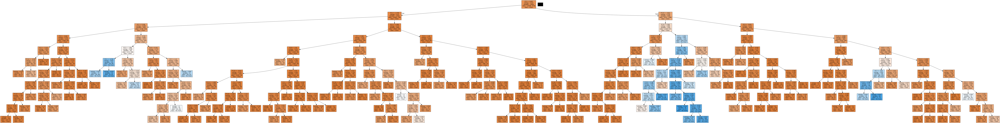

In [56]:
dot_data = StringIO()
export_graphviz(
    dt_best_model,
    out_file=dot_data,
    filled=True,
    feature_names=X_train_PCA.columns.values,
    class_names=["Churn", "No Churn"],
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [57]:
y_train_pred_dt = dt_best_model.predict(X_train_data)
y_test_pred_dt = dt_best_model.predict(X_test_data)

In [58]:
y_train_pred_prob_dt = dt_best_model.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_dt = dt_best_model.predict_proba(X_test_data)[:, 1]

In [59]:
Resultant(
    "DecisionTreeClassifier",
    "Training",
    y_train_data,
    y_train_pred_dt,
    y_train_pred_prob_dt,
)

Classifer on the dataset: Training DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.94      0.97      0.96     14938
           1       0.74      0.54      0.62      2018

    accuracy                           0.92     16956
   macro avg       0.84      0.76      0.79     16956
weighted avg       0.92      0.92      0.92     16956

Confusion Matrix
[[14561   377]
 [  930  1088]]


Classifer on the dataset: Test DecisionTreeClassifier
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      6369
           1       0.67      0.46      0.54       898

    accuracy                           0.90      7267
   macro avg       0.80      0.71      0.75      7267
weighted avg       0.89      0.90      0.90      7267

Confusion Matrix
[[6164  205]
 [ 486  412]]


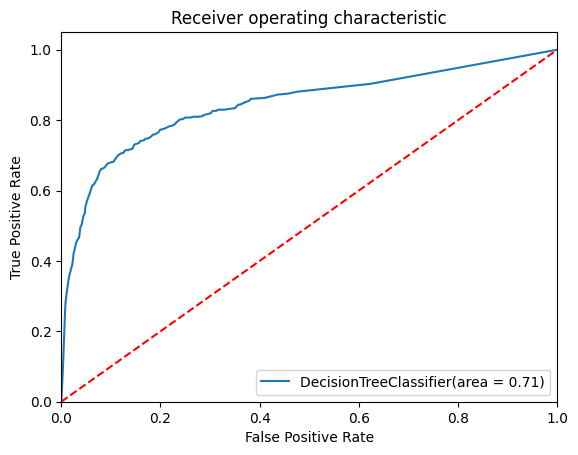

In [60]:
Resultant(
    "DecisionTreeClassifier", "Test", y_test_data, y_test_pred_dt, y_test_pred_prob_dt
)

## **Random Forest Classifier**

Using RandomForest Classifier and CV Search to fit the best model for training data. The best parameters are {'n_estimators': 77,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_depth': 15}

In [61]:
rf_best_model = RandomForestClassifier(
    max_depth=15,
    min_samples_leaf=2,
    min_samples_split=5,
    oob_score=True,
    random_state=42,
    n_estimators=77,
)
rf_best_model.fit(X_train_data, y_train_data)

RandomForestClassifier(max_depth=15, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=77, oob_score=True, random_state=42)

In [62]:
y_train_pred_rf = rf_best_model.predict(X_train_data)
y_test_pred_rf = rf_best_model.predict(X_test_data)

In [63]:
y_train_pred_prob_rf = rf_best_model.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_rf = rf_best_model.predict_proba(X_test_data)[:, 1]

In [64]:
Resultant(
    "RandomForestClassifier",
    "Training",
    y_train_data,
    y_train_pred_rf,
    y_train_pred_prob_rf,
)

Classifer on the dataset: Training RandomForestClassifier
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     14938
           1       0.94      0.76      0.84      2018

    accuracy                           0.97     16956
   macro avg       0.95      0.88      0.91     16956
weighted avg       0.96      0.97      0.96     16956

Confusion Matrix
[[14844    94]
 [  491  1527]]


Classifer on the dataset: Test RandomForestClassifier
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      6369
           1       0.79      0.45      0.57       898

    accuracy                           0.92      7267
   macro avg       0.86      0.72      0.76      7267
weighted avg       0.91      0.92      0.91      7267

Confusion Matrix
[[6264  105]
 [ 496  402]]


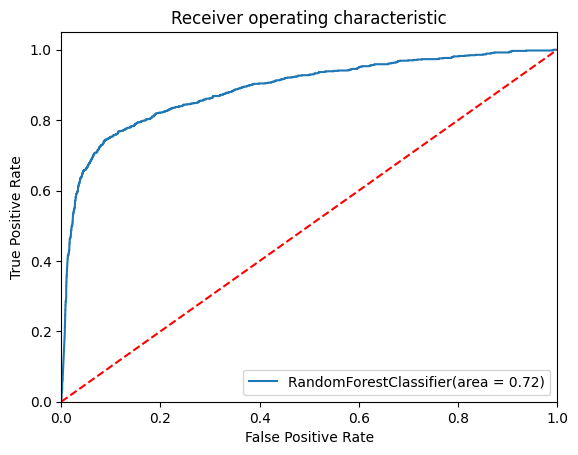

In [65]:
Resultant(
    "RandomForestClassifier", "Test", y_test_data, y_test_pred_rf, y_test_pred_prob_rf
)

# **AdaBoostClassifier**

Using AdaBoostClassifier and Search CV for the best parameters and used in the model. The best parameters are {'n_estimators': 20, 'learning_rate': 0.01}

In [66]:
best_model_abc = AdaBoostClassifier(
    base_estimator=DecisionTreeClassifier(random_state=42),
    random_state=42,
    learning_rate=0.01,
    n_estimators=20,
)
best_model_abc.fit(X_train_data, y_train_data)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(random_state=42),
                   learning_rate=0.01, n_estimators=20, random_state=42)

In [67]:
y_train_pred_abc = best_model_abc.predict(X_train_data)
y_test_pred_abc = best_model_abc.predict(X_test_data)

In [68]:
y_train_pred_prob_abc = best_model_abc.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_abc = best_model_abc.predict_proba(X_test_data)[:, 1]

In [69]:
Resultant(
    "AdaBoostClassifier",
    "Training",
    y_train_data,
    y_train_pred_abc,
    y_train_pred_prob_abc,
)

Classifer on the dataset: Training AdaBoostClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14938
           1       0.97      1.00      0.99      2018

    accuracy                           1.00     16956
   macro avg       0.99      1.00      0.99     16956
weighted avg       1.00      1.00      1.00     16956

Confusion Matrix
[[14882    56]
 [    4  2014]]


Classifer on the dataset: Test AdaBoostClassifier
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      6369
           1       0.68      0.50      0.58       898

    accuracy                           0.91      7267
   macro avg       0.81      0.74      0.76      7267
weighted avg       0.90      0.91      0.90      7267

Confusion Matrix
[[6159  210]
 [ 445  453]]


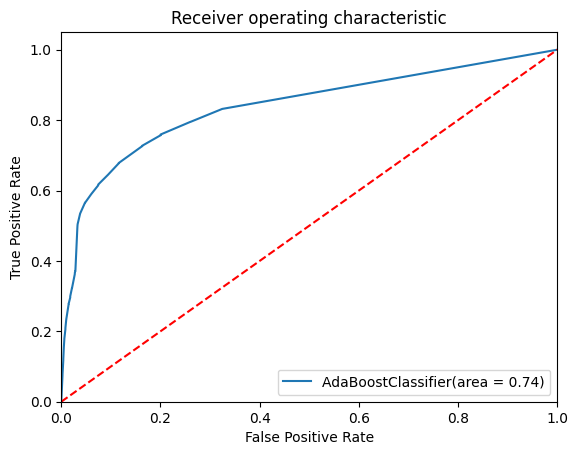

In [70]:
Resultant(
    "AdaBoostClassifier", "Test", y_test_data, y_test_pred_abc, y_test_pred_prob_abc
)

# **GradientBoostingClassifier**

GradientBoostingClassifier using CV search for the best parameters and used in the model. The best parameter are {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}

In [71]:
best_model_gbc = GradientBoostingClassifier(
    random_state=42, n_estimators=100, max_depth=3, learning_rate=0.1
)
best_model_gbc.fit(X_train_data, y_train_data)

GradientBoostingClassifier(random_state=42)

In [72]:
y_train_pred_gbc = best_model_gbc.predict(X_train_data)
y_test_pred_gbc = best_model_gbc.predict(X_test_data)

In [73]:
y_train_pred_prob_gbc = best_model_gbc.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_gbc = best_model_gbc.predict_proba(X_test_data)[:, 1]

In [74]:
Resultant(
    "GradientBoostClassifier",
    "Training",
    y_train_data,
    y_train_pred_gbc,
    y_train_pred_prob_gbc,
)

Classifer on the dataset: Training GradientBoostClassifier
              precision    recall  f1-score   support

           0       0.94      0.98      0.96     14938
           1       0.82      0.52      0.64      2018

    accuracy                           0.93     16956
   macro avg       0.88      0.75      0.80     16956
weighted avg       0.92      0.93      0.92     16956

Confusion Matrix
[[14713   225]
 [  970  1048]]


Classifer on the dataset: Test GradientBoostClassifier
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      6369
           1       0.79      0.47      0.59       898

    accuracy                           0.92      7267
   macro avg       0.86      0.73      0.77      7267
weighted avg       0.91      0.92      0.91      7267

Confusion Matrix
[[6255  114]
 [ 474  424]]


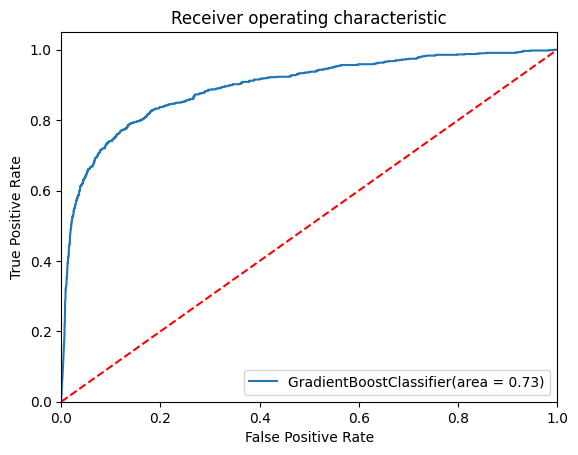

In [75]:
Resultant(
    "GradientBoostClassifier",
    "Test",
    y_test_data,
    y_test_pred_gbc,
    y_test_pred_prob_gbc,
)

# **XGBoost Classifier**

XGBoost using CV search for the best parameters and used in the model. The best parameter are  {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}

In [76]:
best_model_xgbc = XGBClassifier(
    random_state=42, n_estimators=100, max_depth=3, learning_rate=0.1
)
best_model_xgbc.fit(X_train_data, y_train_data)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [77]:
y_train_pred_xgbc = best_model_xgbc.predict(X_train_data)
y_test_pred_xgbc = best_model_xgbc.predict(X_test_data)

In [78]:
y_train_pred_prob_xgbc = best_model_xgbc.predict_proba(X_train_data)[:, 1]
y_test_pred_prob_xgbc = best_model_xgbc.predict_proba(X_test_data)[:, 1]

In [79]:
Resultant(
    "XGradientBoostClassifier",
    "Training",
    y_train_data,
    y_train_pred_xgbc,
    y_train_pred_prob_xgbc,
)

Classifer on the dataset: Training XGradientBoostClassifier
              precision    recall  f1-score   support

           0       0.94      0.99      0.96     14938
           1       0.82      0.49      0.62      2018

    accuracy                           0.93     16956
   macro avg       0.88      0.74      0.79     16956
weighted avg       0.92      0.93      0.92     16956

Confusion Matrix
[[14720   218]
 [ 1023   995]]


Classifer on the dataset: Test XGradientBoostClassifier
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      6369
           1       0.77      0.46      0.58       898

    accuracy                           0.92      7267
   macro avg       0.85      0.72      0.76      7267
weighted avg       0.91      0.92      0.91      7267

Confusion Matrix
[[6249  120]
 [ 486  412]]


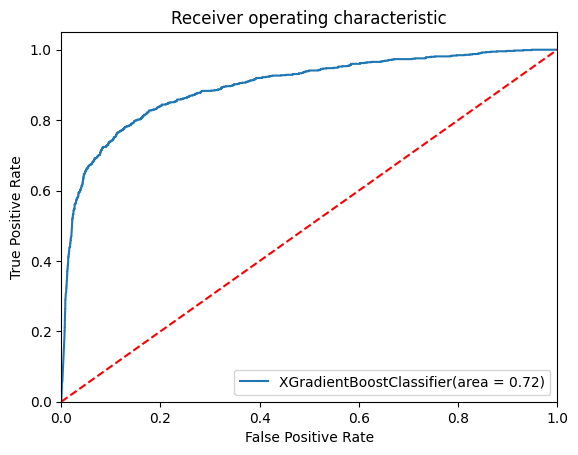

In [80]:
Resultant(
    "XGradientBoostClassifier",
    "Test",
    y_test_data,
    y_test_pred_xgbc,
    y_test_pred_prob_xgbc,
)

# **Generate CSV Files**
Generate csv file from the model output for the final submission

In [81]:
import datetime

pd_test_data = pd.read_csv("test.csv")


def Generate_output(model, model_name):
    pd_test_data["churn_probability"] = model.predict(X_test_PCA).astype(int)
    output_data = pd_test_data[["id", "churn_probability"]]
    print(output_data.head())
    current_datetime = datetime.datetime.now()
    output_data.to_csv(
        "submission_pca_"
        + model_name
        + "_"
        + current_datetime.strftime("%d-%b")
        + ".csv",
        index=False,
    )

**Logistic Regression**

In [82]:
Generate_output(best_lr_model, "lr")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  0
3  70002                  0
4  70003                  1


**Decision Tree Classifier**

In [83]:
Generate_output(dt_best_model, "dt")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  1
3  70002                  0
4  70003                  0


**Random Forest Classifier**

In [84]:
Generate_output(rf_best_model, "rf")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  1
3  70002                  0
4  70003                  0


**AdaBoost Classifier**

In [85]:
Generate_output(best_model_abc, "abc")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  1
3  70002                  0
4  70003                  0


**GradientBoosting Classifier**

In [86]:
Generate_output(best_model_gbc, "gbc")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  1
3  70002                  0
4  70003                  0


**XGBoost Classifier**

In [87]:
Generate_output(best_model_xgbc, "xgbc")

      id  churn_probability
0  69999                  0
1  70000                  0
2  70001                  0
3  70002                  0
4  70003                  0
